In [1]:
import numpy as np
import jax.numpy as jnp
import jax


from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
from circuitmap import NeuralDemixer

import sys
sys.path.append('../')
import nmu
import grid_utils as util
import subtract_utils as subtract_utils
%reload_ext subtract_utils
import os
import glob

plt.rcParams['figure.dpi'] = 300


In [13]:
control_path = "../scripts/220704_B6_Chrome2fGC8_IC_070422_Cell1_Singlespot_Control_A_cmFormat_subtractr_caviar_results.npz"
results = np.load(control_path)

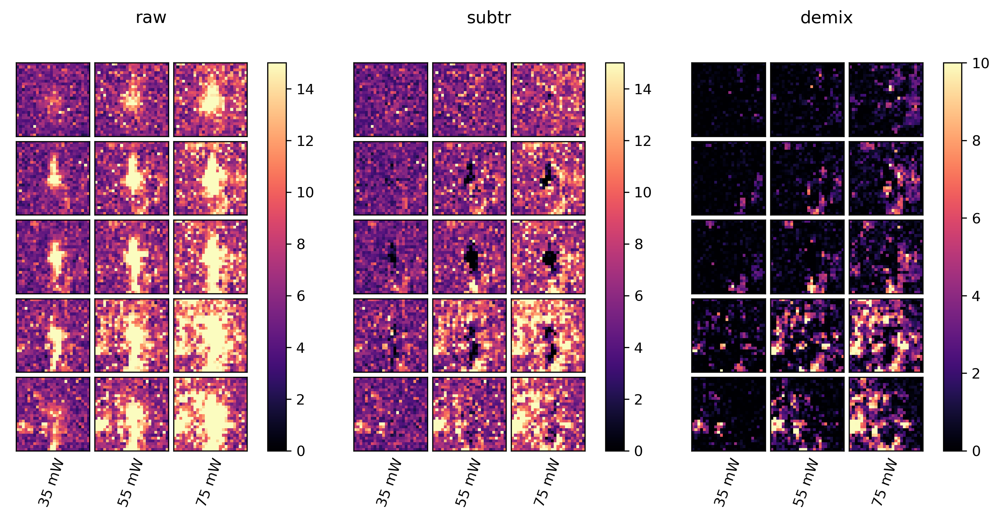

In [14]:
num_planes = results['raw_map'].shape[-1]
fig2 = plt.figure(figsize=(4 * 3, num_planes), dpi=300, facecolor='white')

util.plot_multi_means(fig2,
    [results['raw_map'], results['subtracted_map'], results['demixed_map']], np.arange(num_planes),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma', 'magma'],
    # cbar_labels=['EPSQ (nC)'],
    # zlabels=['subtr', 'demix'],
    map_names=['raw', 'subtr', 'demix'],
    vranges=[(0,15), (0,15), (0,10)],
    powers=np.unique(results['powers']))

dset_name = os.path.basename(control_path).split('.')[0]
plt.savefig(dset_name + '_map_' + '.png', bbox_inches='tight')
plt.show()

In [26]:

# %matplotlib widget
fig3, axs = subtract_utils.plot_subtraction_comparison(
        results['raw_tensor'],
        [results['est_tensor']],
        [results['subtracted_tensor']],
        [results['demixed_tensor']],
        powers=np.unique(results['powers']),
        num_plots_per_power=20,
        sort_by='raw',
)
dset_name = os.path.basename(control_path).split('.')[0]
plt.savefig(dset_name + '_traces_' + '.png', bbox_inches='tight')
plt.show()

In [27]:
synblock_path = "../scripts/220704_B6_Chrome2fGC8_IC_070422_Cell1_Singlespot_NBQX_A_cmFormat_subtractr_caviar_results.npz"
synblock_results = np.load(synblock_path)


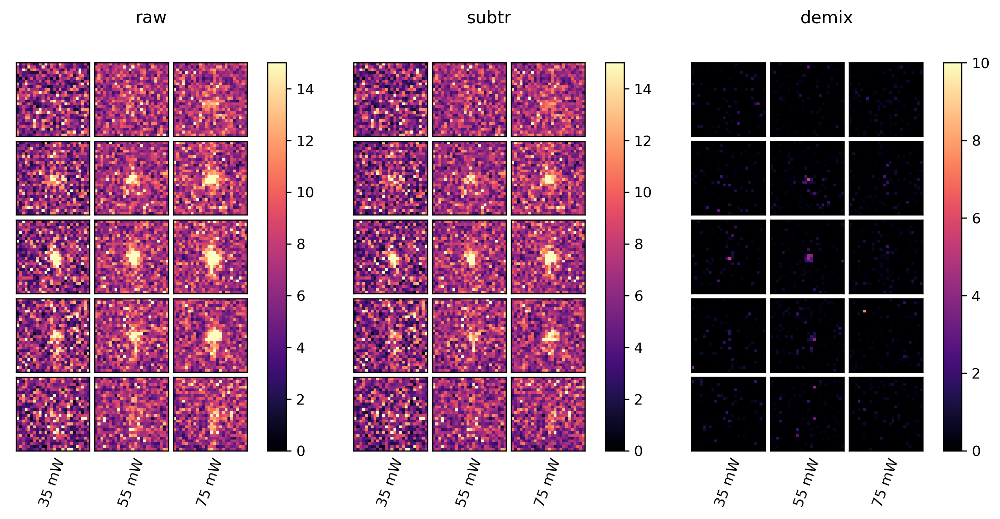

In [28]:
num_planes = synblock_results['raw_map'].shape[-1]
fig2 = plt.figure(figsize=(4 * 3, num_planes), dpi=300, facecolor='white')

util.plot_multi_means(fig2,
    [synblock_results['raw_map'], synblock_results['subtracted_map'], synblock_results['demixed_map']], np.arange(num_planes),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma', 'magma'],
    # cbar_labels=['EPSQ (nC)'],
    # zlabels=['subtr', 'demix'],
    map_names=['raw', 'subtr', 'demix'],
    vranges=[(0,15), (0,15), (0,10)],
    powers=np.unique(synblock_results['powers']))
dset_name = os.path.basename(synblock_path).split('.')[0]
plt.savefig(dset_name + '_map_' + '.png', bbox_inches='tight')
plt.show()

In [29]:
fig3, axs = subtract_utils.plot_subtraction_comparison(
        synblock_results['raw_tensor'],
        [synblock_results['est_tensor']],
        [synblock_results['subtracted_tensor']],
        [synblock_results['demixed_tensor']],
        powers=np.unique(synblock_results['powers']),
        num_plots_per_power=20,
        sort_by='subtracted'
)

dset_name = os.path.basename(synblock_path).split('.')[0]
plt.savefig(dset_name + '_traces_' + '.png', bbox_inches='tight')
plt.show()